# Notebook for demonstrating H2Matrices.jl features and usage

In [1]:
using H2Matrices
using HMatrices: KernelMatrix, ClusterTree, GeometricSplitter, assemble_hmatrix, compression_ratio
using StaticArrays, LinearAlgebra, Random

using Plots

## generating example matrix

For the purpose of illustration, let us consider an abstract matrix K with entry i,j given by the evaluation of some kernel function G on points X[i] and Y[j], where X and Y are vector of points (in 3D here); that is, K[i,j]=G(X[i],Y[j]). This object can be constructed as follows:

In [2]:
const Point3D = SVector{3,Float64}
# sample some points on a sphere
m = 500_00
X = Y = [Point3D(sin(θ)cos(ϕ),sin(θ)*sin(ϕ),cos(θ)) for (θ,ϕ) in zip(π*rand(m),2π*rand(m))]
function G(x,y)
  d = norm(x-y) + 1e-8
  1/(4π*d)
end
K = KernelMatrix(G,X,Y)

50000×50000 KernelMatrix{typeof(G), Vector{SVector{3, Float64}}, Vector{SVector{3, Float64}}, Float64}:
 7.95775e6  0.0425325  0.0400795  …  0.246911   0.0419524  0.0406728
 0.0425325  7.95775e6  0.119059      0.0413449  0.081583   0.177279
 0.0400795  0.119059   7.95775e6     0.0398904  0.17968    0.147863
 0.103214   0.0457581  0.0414544     0.136178   0.0399493  0.0465637
 0.0488508  0.11008    0.0645365     0.0487523  0.0521097  0.0998022
 0.0463349  0.123746   0.093946   …  0.042803   0.0947431  0.0799545
 0.0730021  0.046238   0.044315      0.0948462  0.0418248  0.0504812
 0.0827305  0.0414919  0.0432933     0.118406   0.0436119  0.0448364
 0.0720578  0.0504626  0.0447349     0.0858737  0.0412356  0.0534779
 0.174317   0.0429198  0.0400416     0.314173   0.0401231  0.0427341
 ⋮                                ⋱                        
 0.0881739  0.0429501  0.042379      0.130149   0.0415298  0.0458775
 0.040657   0.0749303  0.171151      0.0417252  0.147142   0.0996807
 0.0409797

## compression with HMatrices.jl

In [3]:
H = assemble_hmatrix(K; atol=1e-6)

# Print compression summary for H-matrix
H_uncompressed = length(H) * sizeof(eltype(H))
H_compressed   = Base.summarysize(H)
H_ratio        = H_uncompressed / H_compressed
_human(b) = b < 1024 ? "$(b) B" : b < 1024^2 ? "$(round(b/1024; digits=1)) KB" : "$(round(b/1024^2; digits=1)) MB"
println("H-matrix:  $(_human(H_uncompressed)) → $(_human(H_compressed))  (ratio: $(round(H_ratio; digits=2))×)")


H-matrix:  19073.5 MB → 1315.5 MB  (ratio: 14.5×)


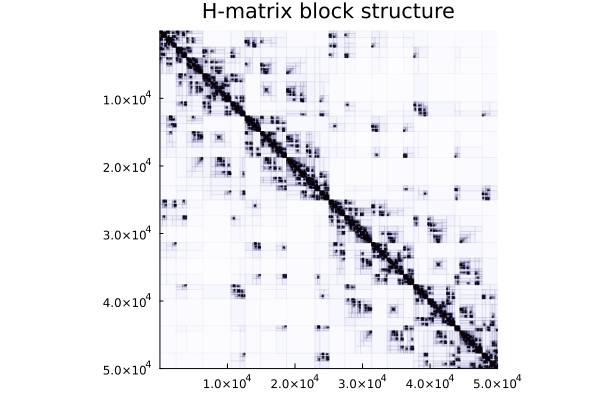

In [4]:
plot(H; title="H-matrix block structure")


### checking approximation

In [5]:
x = rand(m)
y = H*x

sample = 42
exact_sample = sum(K[sample,j] * x[j] for j in 1:m)
abs_error = abs(y[sample] - exact_sample)
rel_error = abs_error / abs(exact_sample)

println("HMatrix sampled absolute error: $abs_error")
println("HMatrix sampled relative error: $rel_error")

HMatrix sampled absolute error: 5.206093192100525e-7
HMatrix sampled relative error: 1.8002484277918702e-13


## compression with H2Matrices.jl

In [6]:
# Assemble an H²-matrix using Chebyshev interpolation
h2 = assemble_h2matrix(K; order=4)

# Compare the two (use Base.summarysize for both for a fair apples-to-apples comparison)
h2_compressed = Base.summarysize(h2)
h2_ratio = H_uncompressed / h2_compressed
println()
println("┌─────────────────────────────────────────────────────┐")
println("│           H-matrix vs H²-matrix Comparison          │")
println("├──────────────┬──────────────┬────────────────────────┤")
println("│              │  Compressed  │  Compression Ratio     │")
println("├──────────────┼──────────────┼────────────────────────┤")
println("│  H-matrix    │  $(lpad(_human(H_compressed), 9))  │  $(lpad(round(H_ratio; digits=2), 8))×            │")
println("│  H²-matrix   │  $(lpad(_human(h2_compressed), 9))  │  $(lpad(round(h2_ratio; digits=2), 8))×            │")
println("├──────────────┼──────────────┼────────────────────────┤")
println("│  Uncompressed│  $(lpad(_human(H_uncompressed), 9))  │                        │")
println("└──────────────┴──────────────┴────────────────────────┘")


┌ Info: H²-matrix assembled
│   size = 50000 × 50000
│   uncompressed = 18.63 GB
│   compressed = 1.03 GB
│   ratio = 18.15
└ @ H2Matrices /Users/yimingzhang/Github/H2Matrices.jl/src/h2matrix.jl:351



┌─────────────────────────────────────────────────────┐
│           H-matrix vs H²-matrix Comparison          │
├──────────────┬──────────────┬────────────────────────┤
│              │  Compressed  │  Compression Ratio     │
├──────────────┼──────────────┼────────────────────────┤
│  H-matrix    │  1315.5 MB  │      14.5×            │
│  H²-matrix   │  1062.7 MB  │     17.95×            │
├──────────────┼──────────────┼────────────────────────┤
│  Uncompressed│  19073.5 MB  │                        │
└──────────────┴──────────────┴────────────────────────┘


### diagnostics: storage, ranks, and blocks

The compression ratio alone can be misleading on small or moderate examples because an H² matrix also stores nested row and column bases. The diagnostics helpers expose the pieces that matter when tuning an assembly.

In [7]:
summary = H2Matrices.compression_summary(h2)
println("storage ratio: ", round(summary.compression_ratio; digits=2), "×")
println("block stats: ", summary.blocks)
println("rank stats: ", summary.ranks)

# For large matrices, use sampled checks rather than forming a dense reference.
println("sampled self-consistency error: ", H2Matrices.sampled_frobenius_error(h2, h2; nsamples=256))


storage ratio: 18.15×
block stats: (nodes = 44361, leaves = 33271, uniform_leaves = 21616, dense_leaves = 11655, empty_leaves = 0, depth = 17)
rank stats: (row = (min = 64, max = 64, mean = 64.0, total = 183616), col = (min = 64, max = 64, mean = 64.0, total = 183616), coupling = (min = 64, max = 64, mean = 64.0, total = 1383424))
sampled self-consistency error: 0.0


### checking approximation

In [8]:
y2 = h2*x

# Compare against the exact kernel matrix-vector product at a sampled index.
sample = 42
exact_sample = sum(K[sample,j] * x[j] for j in 1:m)
abs_error = abs(y2[sample] - exact_sample)
rel_error = abs_error / abs(exact_sample)

println("H² sampled absolute error: $abs_error")
println("H² sampled relative error: $rel_error")


H² sampled absolute error: 0.27159958286210895
H² sampled relative error: 9.391816550236628e-8


## compressed matrix graphs

The H² plot uses a rank-aware palette: lower-rank admissible blocks are dark blue, higher-rank admissible blocks move toward bright gold, and dense near-field blocks are orange. This keeps far-field structure visible as problem size grows.

In [9]:
plot(
    plot(H;  title="H-matrix", dpi=300),
    plot(h2; title="H²-matrix", dpi=300);
    layout=(1,2), size=(1000, 450)
)

# save out the H-matrix and H²-matrix block structure side by side plots
# specify dpi for better resolution
savefig("../docs/src/assets/h_and_h2_matrix_block_structures.png")

# show the plots
# display(plot(
#     plot(H;  title="H-matrix", dpi=300),
#     plot(h2; title="H²-matrix", dpi=300);
#     layout=(1,2), size=(1000, 450)
# ))


"/Users/yimingzhang/Github/H2Matrices.jl/docs/src/assets/h_and_h2_matrix_block_structures.png"

## solver workflow on a compressed operator

The package also includes iterative solver wrappers. The example below uses a small dense SPD matrix only to keep the notebook fast and reproducible, then compresses it to H² form and solves through the compressed `mul!` path.

In [10]:
Random.seed!(7)
nsolve = 300
pts2 = [SVector{2,Float64}(rand(), rand()) for _ in 1:nsolve]

A = Matrix{Float64}(I, nsolve, nsolve)
for j in 1:nsolve, i in 1:nsolve
    A[i, j] += 0.05 * exp(-sum(abs2, pts2[i] - pts2[j]))
end
A = Matrix(Symmetric(A))

tree = ClusterTree(deepcopy(pts2), GeometricSplitter(; nmax=32))
Ah2 = compress_matrix_to_h2(A, tree, tree; rtol=1e-8, maxrank=40, global_index=false)

b = randn(nsolve)
cg = solve_cg(Ah2, b; tol=1e-6, maxiter=200)
gm = solve_gmres(Ah2, b; tol=1e-6, restart=30, maxiter=200)

println("CG converged: ", cg.converged, " in ", cg.iterations, " iterations")
println("CG residual: ", norm(Ah2 * cg.x - b) / norm(b))
println("GMRES converged: ", gm.converged, " in ", gm.iterations, " iterations")
println("GMRES residual: ", norm(Ah2 * gm.x - b) / norm(b))


┌ Info: H²-matrix assembled
│   size = 300 × 300
│   uncompressed = 703.1 KB
│   compressed = 2.2 MB
│   ratio = 0.31
└ @ H2Matrices /Users/yimingzhang/Github/H2Matrices.jl/src/h2matrix.jl:351


CG converged: true in 7 iterations
CG residual: 1.3579383687655588e-7
GMRES converged: true in 7 iterations
GMRES residual: 1.3566307929058885e-7
